## TP introduction aux images
### Données numériques - 2022-23
### Diane Lingrand (Diane.Lingrand@univ-cotedazur.fr)

In [39]:
from skimage import io
from skimage import data
import numpy as np
from matplotlib import pyplot as plt

# Une première image

## Image issue de la bibliothèque scikit-image

In [8]:
img = data.chelsea()

De quel type de donnée s'agit-il ?

In [9]:
print(type(img))

<class 'numpy.ndarray'>


Quelles dimensions (largeur, hauteur, nombre de canaux)?

In [10]:
print(img.shape)

(300, 451, 3)


De quel type sont les valeurs ?

In [11]:
print(type(img[0][0][0]))

<class 'numpy.uint8'>


Peut-on la regarder ?

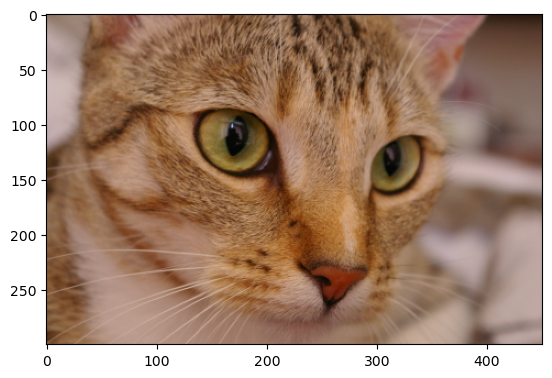

In [12]:
plt.imshow(img)

On peut aussi enlever les axes qui sont présents par défaut:

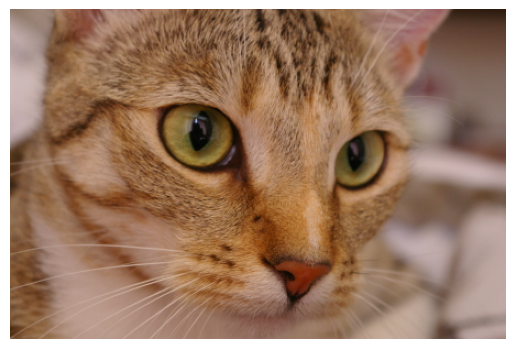

In [13]:
plt.axis('off')
plt.imshow(img)

Et si on change d'image ?

In [14]:
img = data.camera()

Quelles sont les dimensions ? Qu'est-ce qui a changé ? Comment la voyez-vous ?

(667, 1000, 3)


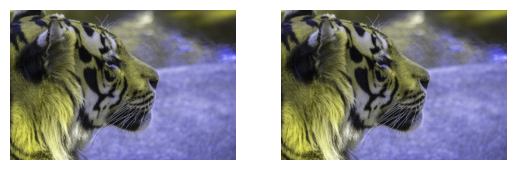

In [45]:
print(img.shape)

plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(img)
plt.subplot(1,2,2)
plt.axis('off')
plt.imshow(img, cmap=plt.cm.gray);

Par défaut, la visualisation des images en niveaux de gris se fait selon une table de couleur <https: //lms.univ-cotedazur.fr/%22https://matplotlib.org/stable/tutorials/colors/colormaps.html/%22> qui n'est pas grise. Si vous souhaitez voir l'image en niveaux de gris, il faut le spécifier (cmap=plt.cm.gray).

## Image issue de votre disque dur

Testez différentes images au format JPG ou PNG. Regardez les dimensions et affichez les images.

In [16]:
img1 = io.imread('bat.png')
img2 = io.imread('tiger.jpg')

In [17]:
print(img1.shape)
print(img2.shape)

(411, 500, 4)
(667, 1000, 3)


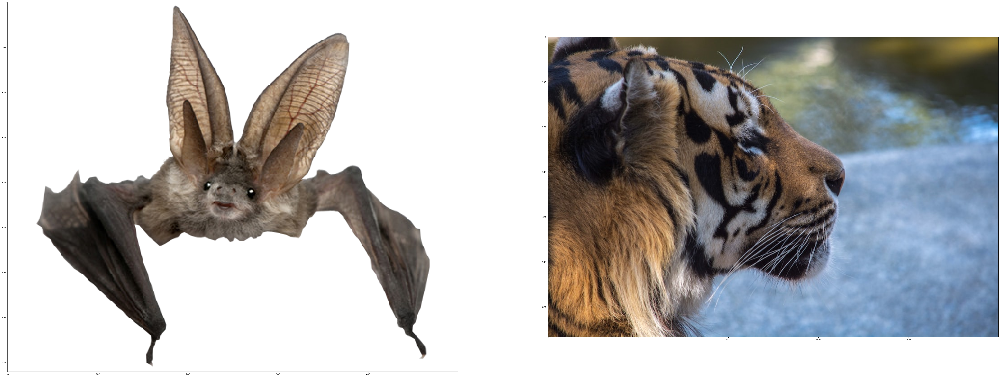

In [18]:
#une figure avec 2 images
fig =plt.figure(figsize=(80, 40))
ax = fig.add_subplot(1, 2, 1)
plt.imshow(img1)
ax = fig.add_subplot(1, 2, 2)
plt.imshow(img2)
plt.show()

# Les canaux couleurs

## Visualisation descomposantes R, G et B

Reprenons une image couleur à 3 canaux. On peut visualiserla composante rouge soit en niveaux de gris, soit en couleur:

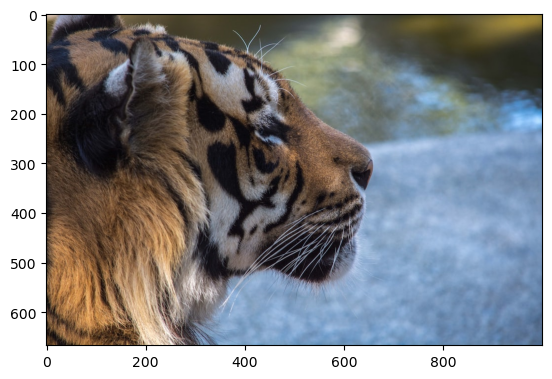

In [19]:
img=img2.copy() 
plt.imshow(img)

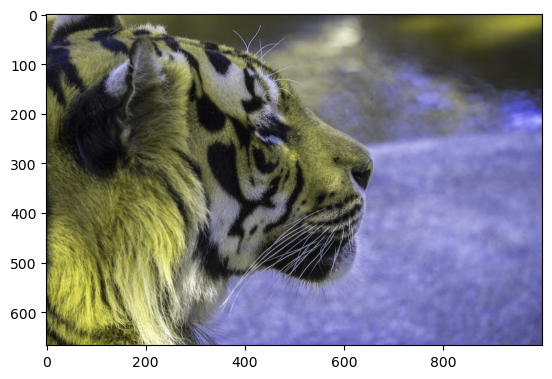

In [21]:
# une première solution
sh =img.shape
w = sh[0]
h = sh[1]
for i in range(0,w):
    for j in range(0,h):
        img[i][j][1] = img[i][j][0] # ou 0
img[i][j][2] = img[i][j][0] # ou 0
plt.imshow(img)

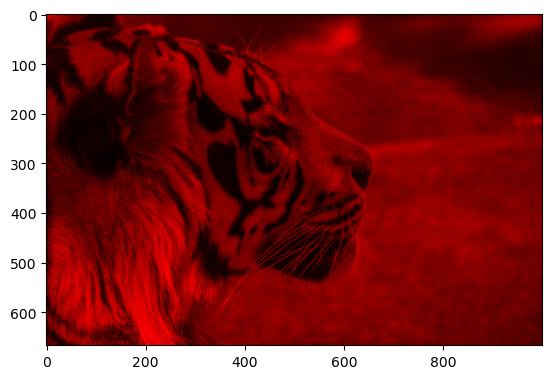

In [33]:
# une autre solution, plus compacte et... plus efficace!
rMask = [1,0,0]

plt.imshow(rMask*img)

Comment voir cette composante rouge en niveaux de gris?

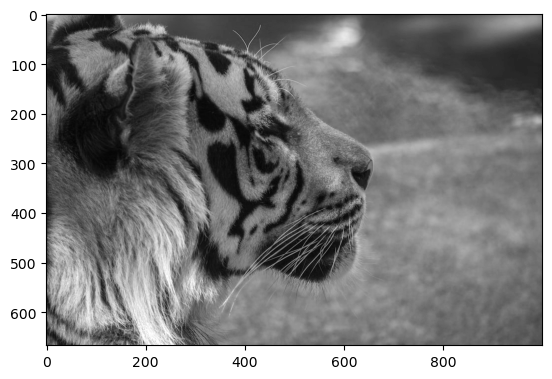

In [34]:
plt.imshow(img[:,:,0], cmap=plt.cm.gray)

Procédez de même pour les composantesvertes et bleues.

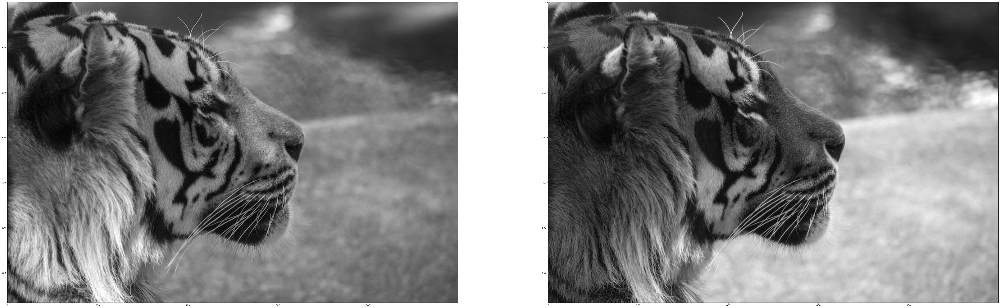

In [32]:
fig =plt.figure(figsize=(80, 40))
ax = fig.add_subplot(1, 2, 1)
plt.imshow(img[:,:,1], cmap=plt.cm.gray)
ax = fig.add_subplot(1, 2, 2)
plt.imshow(img[:,:,2], cmap=plt.cm.gray)
plt.show()

A partir d'une image d'une composante en niveaux de gris, seriez-vous capable de trouver de quelle composante il s'agit?

> Non, on ne peut pas le retrouver sans l'image originale

Quelle composante semble la plus proche de l'image des intensités ?

> La rouge, mais toutes sont assez proches

## Visualisation des composantes HSV

Pour cela,n'oubliez pas de consulter la documentation <https://scikit-image.org/docs/dev/api/skimage.color.html#skimage.color.rgb2hsv>.

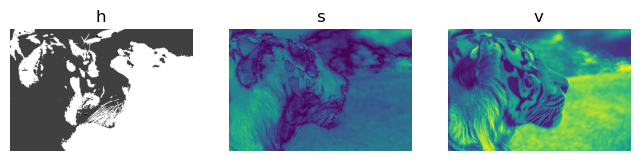

In [50]:
img_hsv = color.rgb2hsv(img)


h = img_hsv[:, :, 0]
s = img_hsv[:, :, 1]
v = img_hsv[:, :, 2]

fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(8, 2))
ax0.imshow(h,cmap='gray')
ax0.axis('off')
ax0.set_title("h")
ax1.imshow(s)
ax1.axis('off')
ax1.set_title("s")
ax2.imshow(v)
ax2.axis('off')
ax2.set_title("v")

plt.show()

## Visualisation des composantes YUV

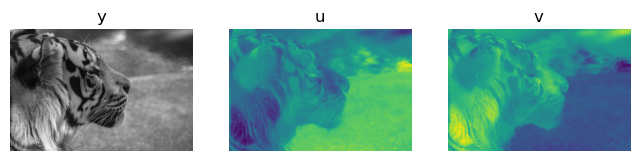

In [65]:
img_yuv = color.rgb2yuv(img)


h = img_yuv[:, :, 0]
s = img_yuv[:, :, 1]
v = img_yuv[:, :, 2]

fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(8, 2))
ax0.imshow(h,cmap='gray')
ax0.axis('off')
ax0.set_title("y")
ax1.imshow(s)
ax1.axis('off')
ax1.set_title("u")
ax2.imshow(v)
ax2.axis('off')
ax2.set_title("v")

plt.show()

Quelle composante comporte le plus de détails ?
> Le premier, le luma

Visualiser U et V à Y constant: onconvertira tout d'abord l'image RGB en YUV, puis, en fixant Y constant sur toute l'image (par exemple une valeur moyenne), on recalculera RBG en fonction de ce Y et des composantes U et V initiales.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


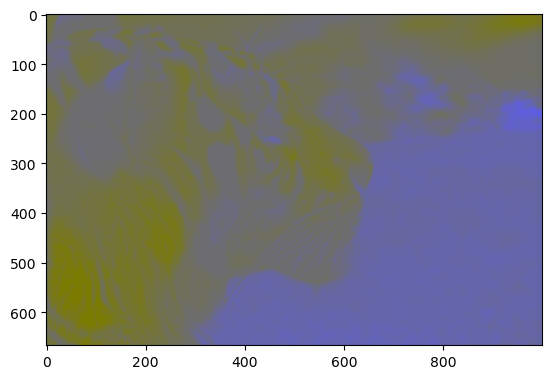

In [70]:
img_yuv2 = img_yuv.copy()
average_y = np.mean(img_yuv2[:,:,0])
img_yuv2[:,:,0] = average_y

img_rgb2 = color.yuv2rgb(img_yuv2)
plt.imshow(img_rgb2);

# Des transformations simples

### video inverse

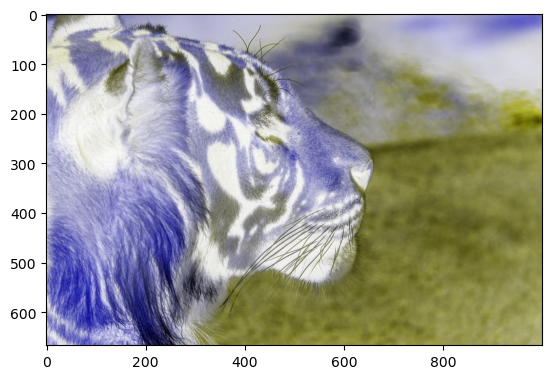

In [61]:
plt.imshow(np.invert(img))

### extraire, par exemple, lesparties jaunes d'une image

On peut faire des seuillages directement sur l'image:

In [94]:
binary = img[:,:,0] >100

In [93]:
print(binary.shape)

(667, 1000)


In [86]:
print(type(binary[0][0]))

<class 'numpy.bool_'>


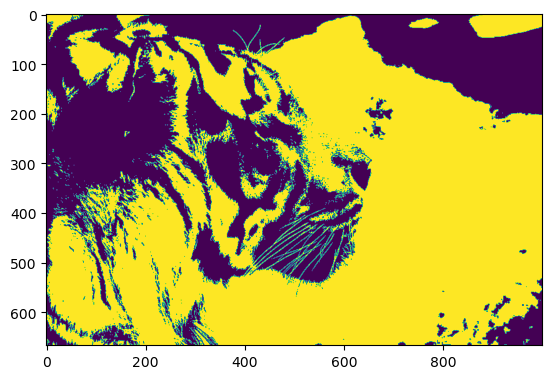

In [99]:
plt.imshow(binary)

### histogramme d'une image

In [88]:
img = img2.copy() # onrepart de l'image d'origine

In [91]:
histR, bin_edges = np.histogram(img[:,:,0], bins=255)
histG,bin_edges = np.histogram(img[: ,: ,1], bins=255)
histB, bin_edges =np.histogram(img[: ,: ,2], bins=255)

/tmp/ipykernel_45205/330487103.py:5: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.
  plt.stem(bin_edges[:-1], histR, linefmt='red',use_line_collection=True, markerfmt='')
/tmp/ipykernel_45205/330487103.py:8: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.
  plt.stem(bin_edges[:-1], histG, linefmt='green',use_line_collection=True, markerfmt='')
/tmp/ipykernel_45205/330487103.py:11: MatplotlibDeprecationWarning: The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection

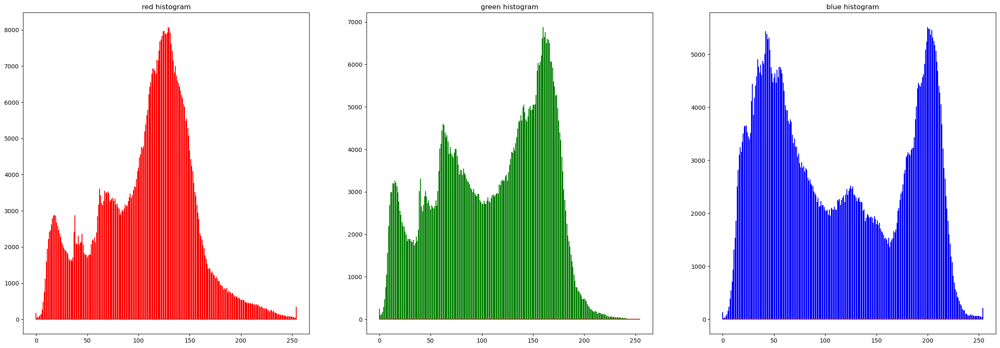

In [96]:
# en supposant qu'il s'agit d'une imageRGB
fig = plt.figure(figsize=(30,10))
ax =fig.add_subplot(1, 3, 1)
ax.title.set_text('red histogram')
plt.stem(bin_edges[:-1], histR, linefmt='red',use_line_collection=True, markerfmt='')
ax =fig.add_subplot(1, 3, 2)
ax.title.set_text('green histogram')
plt.stem(bin_edges[:-1], histG, linefmt='green',use_line_collection=True, markerfmt='')
ax =fig.add_subplot(1, 3, 3)
ax.title.set_text('blue histogram')
plt.stem(bin_edges[:-1], histB, linefmt='blue',use_line_collection=True, markerfmt='')
plt.show()